In [1]:
# DASK client set

import os
import sys
from dask.distributed import Client
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json', threads_per_worker=2, n_workers=6)
client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json')
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler_10.json')  

# add private module path for workers
# client.run(lambda: os.environ.update({'PYTHONPATH': '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'}))
# def add_path():
#     if '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2' not in sys.path:
#         sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')

# client.run(add_path)

def setup_module_path():
    module_path = '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'
    if module_path not in sys.path:
        sys.path.append(module_path)

client.run(setup_module_path)

client

# get path for path changes in Jupyter notebook: File - Open from Path - insert relative_path
notebook_path = os.path.abspath(".")
_, _, relative_path = notebook_path.partition('/all/')
relative_path = '/all/' + relative_path
relative_path

'/all/Model/CESM2/Earth_System_Predictability/ASSM/Aleph'

# Load modules

In [2]:
# load public modules

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.ticker as mticker
import matplotlib.path as mpath
import matplotlib.cm as cm2
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats
from scipy.interpolate import griddata
import cmocean
from cmcrameri import cm
import warnings
warnings.simplefilter(action='ignore')
import pandas as pd
import cftime
import pop_tools
from pprint import pprint
import time
import subprocess
import re as re_mod
import cftime
import datetime
from scipy.stats import ttest_1samp

In [3]:
# load private modules

import sys
sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')
from KYY_CESM2_preprocessing import CESM2_config
# import KYY_CESM2_preprocessing
# import importlib
# importlib.reload(KYY_CESM2_preprocessing)

# Variable configuration

In [4]:
cfg_var=CESM2_config()
cfg_var.year_s=1960
cfg_var.year_e=2020

cfg_var.setvar('Z500')
cfg_var.list()

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

{'codebase': 'e21',
 'comp': 'atm',
 'compset': 'b',
 'dimension': 'time '
              'lat '
              'lon',
 'long_name': 'Geopotential '
              'Z '
              'at '
              '500 '
              'mbar '
              'pressure '
              'surface',
 'model': 'cam.h1',
 'ndim': 3,
 'resol': 'f09_g17',
 'tfreq': 'day_1',
 'unit': 'm',
 'var': 'Z500',
 'year_e': 2020,
 'year_s': 1960}


# Read dataset

In [5]:
# define preprocessing function

exceptcv=['time','lon','lat','lev', 'TLONG', 'TLAT', 'z_w', cfg_var.var]
def process_coords(ds, sd, ed, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        ds= ds.sel(time=slice(sd, ed))
        return ds
    else:
        return ds.set_coords(coord_vars)


start_date = cftime.DatetimeNoLeap(cfg_var.year_s, 1, 1)
end_date = cftime.DatetimeNoLeap(cfg_var.year_e, 12, 31)
# end_date = cftime.DatetimeNoLeap(cfg_var.year_e+1, 1, 1)


def process_coords_hcst(ds, drop=True, except_coord_vars=['time','lon','lat', 'TLONG', 'TLAT', cfg_var.var]):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    time_len = 1825  # 5 y
    ds = ds.isel(time=slice(0, time_len))
    if drop:
        ds= ds.drop(coord_vars)
        return ds
    else:
        return ds.set_coords(coord_vars)


def process_coords_obs(ds, drop=True, except_coord_vars=['valid_time', 'time','lon','lat', 'TLONG', 'TLAT', 'z']):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        return ds
    else:
        return ds.set_coords(coord_vars)

In [6]:
# Read Hindcast dataset
start_time = time.time()

cfg_var.HCST_path_load(cfg_var.var)

cfg_var.HCST_ds = []
for iyear in range(0, len(cfg_var.HCST_file_list)):
    HCST_ds_tmp = xr.open_mfdataset(cfg_var.HCST_file_list[iyear], 
                           chunks={'time': 1}, 
                           combine='nested',
                           concat_dim=[[*cfg_var.HCST_ensembles], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords_hcst(ds),
                           decode_cf=True, 
                           decode_times=True)
    # HCST_ds_tmp = HCST_ds_tmp.groupby('time.month').mean(dim='time', skipna=True)
    HCST_ds_tmp['time_values'] = HCST_ds_tmp['time'].values
    timedelta_array = np.full(HCST_ds_tmp.time_values.shape, datetime.timedelta(days=0.5))
    new_time = HCST_ds_tmp.time_values - timedelta_array
    HCST_ds_tmp = HCST_ds_tmp.assign(time_values=new_time)
    
    HCST_ds_tmp = HCST_ds_tmp.resample(time='1M').mean(skipna=True)
    HCST_ds_tmp['time_values'] = HCST_ds_tmp['time'].values
    
    HCST_ds_tmp = HCST_ds_tmp.rename({"time": "lmonths"})
    HCST_ds_tmp['lmonths']=range(1,61)
    HCST_ds_tmp = HCST_ds_tmp.assign(time_values=("lmonths", HCST_ds_tmp['time_values'].values))  # time 값을 lmonths 차원과 연결

    HCST_ds_tmp
    
    HCST_ds_a= []
    HCST_ds_a.append(HCST_ds_tmp)
    HCST_ds_xr = xr.concat(HCST_ds_a, dim='lmonths')
    HCST_ds_xr = HCST_ds_xr.expand_dims({'iyear': 1})
    
    cfg_var.HCST_ds.append(HCST_ds_xr)

cfg_var.HCST_ds = xr.concat(cfg_var.HCST_ds, dim='iyear')
cfg_var.HCST_ds = cfg_var.HCST_ds.rename({"concat_dim": "ens_HCST"})
cfg_var.HCST_ds['iyear']=range(cfg_var.year_s, cfg_var.year_e+1)

# time_values의 차원에 맞는 timedelta 배열 생성
timedelta_array = np.full(cfg_var.HCST_ds.time_values.shape, datetime.timedelta(days=15))
# time_values에서 15일을 뺀 새로운 time_values 생성
new_time = cfg_var.HCST_ds.time_values - timedelta_array
# 새로운 time_values로 업데이트
cfg_var.HCST_ds = cfg_var.HCST_ds.assign(time_values=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading HCST: ' + str(elapsed_time))

elasped time for reading HCST: 182.61382365226746


In [7]:
# Read LE dataset

start_time = time.time()


cfg_var.LE_path_load(cfg_var.var)
cfg_var.LE_ds = xr.open_mfdataset(cfg_var.LE_file_list[0], 
                       chunks={'time': 1}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)      
cfg_var.LE_ds['time_values'] = cfg_var.LE_ds['time'].values
timedelta_array = np.full(cfg_var.LE_ds.time_values.shape, datetime.timedelta(days=0.5))
new_time = cfg_var.LE_ds.time_values - timedelta_array
cfg_var.LE_ds = cfg_var.LE_ds.assign(time_values=new_time)

cfg_var.LE_ds = cfg_var.LE_ds.resample(time='1M').mean(skipna=True)
cfg_var.LE_ds['time_values'] = cfg_var.LE_ds['time'].values

cfg_var.LE_ds = cfg_var.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.LE_ds.time))
cfg_var.LE_ds = cfg_var.LE_ds.assign_coords(time=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))

elasped time for reading LE: 46.487579107284546


In [8]:
# Read ODA dataset (all)

start_time = time.time()

cfg_var.ODA_path_load(cfg_var.var)

ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][0:10],
                           chunks={'time': 1}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[0:10]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

ODA_ds2 = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
                           chunks={'time': 1}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

# en4.2 -> until 2021; projdv7.3 -> until 2020; need to be read separately
ODA_ds_a = []
ODA_ds_a.append(ODA_ds)
# ODA_ds_a['time_values'] = ODA_ds_a['time'].values
# timedelta_array = np.full(ODA_ds_a.time_values.shape, datetime.timedelta(days=0.5))
# new_time = ODA_ds_a.time_values - timedelta_array
# ODA_ds_a = ODA_ds_a.assign(time_values=new_time)
# ODA_ds_a = ODA_ds_a.resample(time='1M').mean(skipna=True)
# ODA_ds_a['time_values'] = ODA_ds_a['time'].values
ODA_ds_xr = xr.concat(ODA_ds_a, dim='time')
ODA_ds_xr = ODA_ds_xr.expand_dims({'ens': range(10)})

ODA_ds2_a = []
ODA_ds2_a.append(ODA_ds2)
# ODA_ds2_a['time_values'] = ODA_ds2_a['time'].values
# timedelta_array = np.full(ODA_ds2_a.time_values.shape, datetime.timedelta(days=0.5))
# new_time = ODA_ds2_a.time_values - timedelta_array
# ODA_ds2_a = ODA_ds2_a.assign(time_values=new_time)
# ODA_ds2_a = ODA_ds2_a.resample(time='1M').mean(skipna=True)
# ODA_ds2_a['time_values'] = ODA_ds2_a['time'].values
ODA_ds2_xr = xr.concat(ODA_ds2_a, dim='time')
ODA_ds2_xr = ODA_ds2_xr.expand_dims({'ens': range(10, 20)})

cfg_var.ODA_ds = []
cfg_var.ODA_ds.append(ODA_ds_xr)
cfg_var.ODA_ds.append(ODA_ds2_xr)
cfg_var.ODA_ds = xr.concat(cfg_var.ODA_ds, dim='ens')
cfg_var.ODA_ds = cfg_var.ODA_ds.reindex(ens=list(range(1, 20+1)))
cfg_var.ODA_ds = cfg_var.ODA_ds.sortby('time')


cfg_var.ODA_ds['time_values'] = cfg_var.ODA_ds['time'].values
timedelta_array = np.full(cfg_var.ODA_ds.time_values.shape, datetime.timedelta(days=0.5))
new_time = cfg_var.ODA_ds.time_values - timedelta_array
cfg_var.ODA_ds = cfg_var.ODA_ds.assign(time_values=new_time)
cfg_var.ODA_ds = cfg_var.ODA_ds.resample(time='1M').mean(skipna=True)
cfg_var.ODA_ds['time_values'] = cfg_var.ODA_ds['time'].values

cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})


new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)
cfg_var.ODA_ds = cfg_var.ODA_ds.drop('ens')
cfg_var.ODA_ds=cfg_var.ODA_ds.mean(dim='ens')
end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))

elasped time for reading ODA: 44.19269919395447


In [9]:
#Read ADA dataset
start_time = time.time()

cfg_var.ADA_path_load(cfg_var.var)
cfg_var.ADA_ds = xr.open_mfdataset(cfg_var.ADA_file_list[0], 
                       chunks={'time': 1}, 
                       combine='nested',
                       concat_dim=[[*cfg_var.ADA_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)      

cfg_var.ADA_ds['time_values'] = cfg_var.ADA_ds['time'].values
timedelta_array = np.full(cfg_var.ADA_ds.time_values.shape, datetime.timedelta(days=0.5))
new_time = cfg_var.ADA_ds.time_values - timedelta_array
cfg_var.ADA_ds = cfg_var.ADA_ds.assign(time_values=new_time)
cfg_var.ADA_ds = cfg_var.ADA_ds.resample(time='1M').mean(skipna=True)
cfg_var.ADA_ds['time_values'] = cfg_var.ADA_ds['time'].values

cfg_var.ADA_ds = cfg_var.ADA_ds.rename({"concat_dim": "ens_ADA"})
new_time = cfg_var.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ADA_ds.time))
cfg_var.ADA_ds = cfg_var.ADA_ds.assign_coords(time=new_time)


# cfg_var.ADA_ds.time
# # 중복 여부 확인
# duplicates = np.unique(cfg_var.ADA_ds.time.values, return_counts=True)
# # 중복된 값 출력
# print(duplicates[0][duplicates[1] > 1])  # 중복된 시간 값

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ADA: ' + str(elapsed_time))

elasped time for reading ADA: 12.278619527816772


In [10]:
# # Read ODA dataset (projd only)
# start_time = time.time()

# cfg_var.ODA_path_load(cfg_var.var)

# cfg_var.ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
#                            chunks={'time': 1}, 
#                            combine='nested', 
#                            concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
#                            parallel=True,
#                            preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                            decode_cf=True, 
#                            decode_times=True)

# cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})
# new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
# cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ODA: ' + str(elapsed_time))

In [11]:
# Read Observation dataset
start_time = time.time()

cfg_var.OBS_path_load(cfg_var.var)
# cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
#                        combine='nested',
#                        concat_dim= 'time',
#                        chunks={'time': 6}, 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                        decode_cf=True, 
#                        decode_times=True,
#                        engine='h5netcdf')
# cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
#                        chunks={'time': 12}, 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords_obs(ds),
#                        decode_cf=True, 
#                        decode_times=True,)
cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
                       chunks={'time': 1}, 
                       parallel=True,
                       preprocess=lambda ds: process_coords_obs(ds),
                       decode_cf=True,)

cfg_var.OBS_ds = cfg_var.OBS_ds.rename({cfg_var.OBS_var: cfg_var.var})

# new_time = cfg_var.OBS_ds.time + np.array([datetime.timedelta(days=15)] * len(cfg_var.OBS_ds.time))
# cfg_var.OBS_ds = cfg_var.OBS_ds.assign_coords(time=new_time)

if cfg_var.var=='SSH':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[396:732])
elif cfg_var.var=='photoC_TOT_zint_100m':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[456:732])
elif cfg_var.var=='FG_CO2':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[264:732])
elif cfg_var.var=='DpCO2_ALT_CO2':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[264:732])

# valid_time to time
ds = cfg_var.OBS_ds
ds = ds.rename({'valid_time': 'time'})  # 변수 및 차원 이름 동시 변경
cfg_var.OBS_ds = ds  # 변경된 데이터셋 다시 저장

# 크기가 1인 차원 제거
ds = cfg_var.OBS_ds
ds = ds.squeeze(dim='pressure_level')  # 'pressure_level' 차원 제거
cfg_var.OBS_ds = ds


# global mean removal for SSH
if cfg_var.var=='SSH':
    lat_mask = (ds_grid.TLAT >= -60) & (ds_grid.TLAT <= 60)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var.OBS_ds[cfg_var.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var.OBS_ds['SSH'] = cfg_var.OBS_ds[cfg_var.var] - cfg_var.OBS_ds['gm']
elif cfg_var.var=='DpCO2_ALT_CO2':
    lat_mask = (ds_grid.TLAT >= -90) & (ds_grid.TLAT <= 90)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var.OBS_ds[cfg_var.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var.OBS_ds['DpCO2_ALT_CO2'] = cfg_var.OBS_ds[cfg_var.var] - cfg_var.OBS_ds['gm']

# Step 1: 결측값이 아닌 값의 비율 계산
# 결측값이 아닌 값들에 대해 True, 결측값에 대해 False로 표시
valid_data_count = (~cfg_var.OBS_ds[cfg_var.var].isnull()).sum(dim='time')
# Step 2: 전체 시간 축의 길이 (즉, 데이터가 있어야 할 총 시간 개수)
total_time_steps = cfg_var.OBS_ds['time'].size
# Step 3: 80% 이상의 값이 있는지 계산
# 비율 계산 후, 80% 이상이면 True, 그렇지 않으면 False로 표시
threshold = 0.8
mask = (valid_data_count / total_time_steps) >= threshold
# Step 4: 마스크 변수를 데이터셋에 추가
cfg_var.OBS_ds['mask_80_percent'] = mask
cfg_var.OBS_ds['mask_80_percent'].compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS: ' + str(elapsed_time))

elasped time for reading OBS: 10.177940607070923


# Take annual means

In [12]:
start_time = time.time()
obs_annual_mean = cfg_var.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)
obs_rolling_mean = obs_annual_mean.rolling(year=4, min_periods=4).mean()
obs_rolling_time_mean = obs_annual_mean['year'].rolling(year=4, min_periods=4).mean()
obs_rolling_mean = obs_rolling_mean.assign_coords(year=obs_rolling_time_mean)
valid_index = np.where(~np.isnan(obs_rolling_mean['year']))[0]
obs_rolling_mean = obs_rolling_mean.isel(year=valid_index)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating annual mean: ' + str(elapsed_time))

elasped time for calculating annual mean: 0.4761078357696533


In [62]:
from dask.diagnostics import ProgressBar

# 멤버 리스트 설정
ensemble_members = range(0, 20)  # 멤버 0~19

# 저장 경로 설정
output_dir = '/mnt/lustre/proj/earth.system.predictability/ASSM_EXP/archive_yearly_transfer/temp_python/'  # 결과 저장 폴더
os.makedirs(output_dir, exist_ok=True)  # 폴더 생성

# # 처리 함수 정의
# def process_and_save_member(member_id, input_ds, output_path):
#     # 멤버별 데이터 필터링
#     # member_ds = input_ds.sel(ens_ODA=member_id)

#     ODA_ds2_tmp = xr.open_mfdataset(cfg_var.ODA_file_list[0][member_id], 
#                                chunks={'time': 6}, 
#                                combine='nested', 
#                                # concat_dim=[[*cfg_var.ODA_ensembles[member_id]], 'time'], 
#                                concat_dim= ['time'],                                     
#                                parallel=True,
#                                preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                                decode_cf=True, 
#                                decode_times=True)
#     ODA_ds2_tmp['time_values'] = ODA_ds2_tmp['time'].values
#     timedelta_array = np.full(ODA_ds2_tmp.time_values.shape, datetime.timedelta(days=0.5))
#     new_time = ODA_ds2_tmp.time_values - timedelta_array
#     ODA_ds2_tmp = ODA_ds2_tmp.assign(time_values=new_time)
    
#     # 연평균 계산 (메모리 절약)
#     annual_mean = ODA_ds2_tmp.groupby('time.year').mean(dim='time', skipna=True)

#     # NetCDF로 저장
#     output_file = f"{output_path}member_{member_id}_annual_mean.nc"
#     annual_mean.to_netcdf(output_file)
#     print(f"Saved: {output_file}")
#     return output_file

# # 1. 각 멤버별 연평균 계산 및 저장
# with ProgressBar():  # 진행 상황 표시
#     for member in ensemble_members:
#         process_and_save_member(member, cfg_var.ODA_ds, output_dir)

# 2. 저장된 파일을 다시 불러와 결합
oda_full_annual_mean_list = []
with ProgressBar():
    for member in ensemble_members:
        # 저장된 파일 불러오기
        output_file = f"{output_dir}member_{member}_annual_mean.nc"
        member_ds = xr.open_dataset(output_file)  # 메모리 절약을 위해 lazy load
        oda_full_annual_mean_list.append(member_ds)

# 멤버별 데이터 결합
oda_full_annual_mean = xr.concat(oda_full_annual_mean_list, dim='ens_ODA')
oda_full_annual_mean['ens_ODA'] = ensemble_members  # 멤버 차원 추가

# # 최종 결과 저장 (선택 사항)
# oda_full_annual_mean.to_netcdf(f"{output_dir}oda_full_annual_mean.nc")

In [16]:
from dask.diagnostics import ProgressBar

# 멤버 리스트 설정
ensemble_members = range(0, 50)  # 멤버 0~19

# 저장 경로 설정
output_dir = '/mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/'  # 결과 저장 폴더
os.makedirs(output_dir, exist_ok=True)  # 폴더 생성

# 처리 함수 정의
def process_and_save_member(member_id, input_ds, output_path):
    # 멤버별 데이터 필터링
    # member_ds = input_ds.sel(ens_ODA=member_id)

    ODA_ds2_tmp = xr.open_mfdataset(cfg_var.LE_file_list[0][member_id], 
                               chunks={'time': 6}, 
                               combine='nested', 
                               # concat_dim=[[*cfg_var.ODA_ensembles[member_id]], 'time'], 
                               concat_dim= ['time'],                                     
                               parallel=True,
                               preprocess=lambda ds: process_coords(ds, start_date, end_date),
                               decode_cf=True, 
                               decode_times=True)
    ODA_ds2_tmp['time_values'] = ODA_ds2_tmp['time'].values
    timedelta_array = np.full(ODA_ds2_tmp.time_values.shape, datetime.timedelta(days=0.5))
    new_time = ODA_ds2_tmp.time_values - timedelta_array
    ODA_ds2_tmp = ODA_ds2_tmp.assign(time_values=new_time)
    
    # 연평균 계산 (메모리 절약)
    annual_mean = ODA_ds2_tmp.groupby('time.year').mean(dim='time', skipna=True)

    # NetCDF로 저장
    output_file = f"{output_path}member_{member_id}_annual_mean.nc"
    annual_mean.to_netcdf(output_file)
    print(f"Saved: {output_file}")
    return output_file

# 1. 각 멤버별 연평균 계산 및 저장
with ProgressBar():  # 진행 상황 표시
    for member in ensemble_members:
        process_and_save_member(member, cfg_var.ODA_ds, output_dir)

# 2. 저장된 파일을 다시 불러와 결합
le_full_annual_mean_list = []
with ProgressBar():
    for member in ensemble_members:
        # 저장된 파일 불러오기
        output_file = f"{output_dir}member_{member}_annual_mean.nc"
        member_ds = xr.open_dataset(output_file)  # 메모리 절약을 위해 lazy load
        le_full_annual_mean_list.append(member_ds)

# 멤버별 데이터 결합
le_full_annual_mean = xr.concat(le_full_annual_mean_list, dim='ens_LE')
le_full_annual_mean['ens_LE'] = ensemble_members  # 멤버 차원 추가

# # 최종 결과 저장 (선택 사항)
# oda_full_annual_mean.to_netcdf(f"{output_dir}oda_full_annual_mean.nc")

Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_0_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_1_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_2_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_3_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_4_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_5_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_6_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS2/archive_yearly_transfer/temp_python/member_7_annual_mean.nc
Saved: /mnt/lustre/proj/earth.system.predictability/LENS

In [57]:
from dask.diagnostics import ProgressBar

# 멤버 리스트 설정
ensemble_members = range(0, 20)  # 멤버 0~19

# 저장 경로 설정
output_dir = '/mnt/lustre/proj/earth.system.predictability/HCST_EXP/archive_yearly_transfer/temp_python/'  # 결과 저장 폴더
os.makedirs(output_dir, exist_ok=True)  # 폴더 생성


# 처리 함수 정의
def process_and_save_member(member_id, input_ds, output_path):
    # 멤버별 데이터 필터링
    # member_ds = input_ds.sel(ens_ODA=member_id)
    for iyear in range(0, len(cfg_var.HCST_file_list)):
    # for iyear in range(0, 3):
        ODA_ds2_tmp = xr.open_mfdataset(cfg_var.HCST_file_list[iyear][member_id], 
                                   chunks={'time': 6}, 
                                   combine='nested', 
                                   concat_dim= ['time'],                                     
                                   parallel=True,
                                   preprocess=lambda ds: process_coords_hcst(ds),
                                   decode_cf=True, 
                                   decode_times=True)
        # ODA_ds2_tmp['time_values'] = ODA_ds2_tmp['time'].values
        # timedelta_array = np.full(ODA_ds2_tmp.time_values.shape, datetime.timedelta(days=0.5))
        # new_time = ODA_ds2_tmp.time_values - timedelta_array
        # ODA_ds2_tmp = ODA_ds2_tmp.assign(time_values=new_time)
        
        # 연평균 계산 (메모리 절약)
        annual_mean = ODA_ds2_tmp.groupby('time.year').mean(dim='time', skipna=True)
        annual_mean = annual_mean.rename({"year": "lyears"})
        # print(annual_mean)
        annual_mean['lyears']=range(1,6)
        
        annual_mean = annual_mean.assign(time_values=("lyears", annual_mean['lyears'].values))  # time 값을 lmonths 차원과 연결
        annual_mean.expand_dims({'iyear': 1})
        
        # NetCDF로 저장
        output_file = f"{output_path}member_{member_id}_i{iyear+cfg_var.year_s}_annual_mean.nc"
        annual_mean.to_netcdf(output_file)
        # print(f"Saved: {output_file}")
    return output_file

    # HCST_ds_tmp = HCST_ds_tmp.rename({"time": "lmonths"})
    # HCST_ds_tmp['lmonths']=range(1,61)
    # HCST_ds_tmp = HCST_ds_tmp.assign(time_values=("lmonths", HCST_ds_tmp['time_values'].values))  # time 값을 lmonths 차원과 연결

    # HCST_ds_tmp
    
    # HCST_ds_a= []
    # HCST_ds_a.append(HCST_ds_tmp)
    # HCST_ds_xr = xr.concat(HCST_ds_a, dim='lmonths')
    # HCST_ds_xr = HCST_ds_xr.expand_dims({'iyear': 1})



# 1. 각 멤버별 연평균 계산 및 저장
with ProgressBar():  # 진행 상황 표시
    for member in ensemble_members:
        process_and_save_member(member, cfg_var.HCST_ds, output_dir)


hcst_full_annual_mean_list = []
with ProgressBar():
    for iyear in range(0, len(cfg_var.HCST_file_list)):  # iyear 루프
        member_list = []  # 멤버별 리스트 초기화

        for member in ensemble_members:  # 멤버 루프
            # 저장된 파일 불러오기
            output_file = f"{output_dir}member_{member}_i{iyear+cfg_var.year_s}_annual_mean.nc"
            member_ds = xr.open_dataset(output_file)  # 메모리 절약을 위해 lazy load
            member_list.append(member_ds)  # 멤버 데이터 추가

        # 멤버별 데이터 결합 (ens_HCST 차원 추가)
        annual_mean = xr.concat(member_list, dim='ens_HCST')
        annual_mean['ens_HCST'] = ensemble_members  # 멤버 차원 설정

        # iyear 차원 추가 (결합된 결과)
        annual_mean = annual_mean.expand_dims({'iyear': [iyear+cfg_var.year_s]})  # 차원 확장
        hcst_full_annual_mean_list.append(annual_mean)  # 결과 리스트에 추가

# 최종적으로 iyear 차원으로 결합
hcst_full_annual_mean = xr.concat(hcst_full_annual_mean_list, dim='iyear')


In [65]:
hcst_annual_mean=hcst_full_annual_mean

In [68]:
# start_time = time.time()

# # # Step 1: OBS_ds에서 NaN이 아닌 시간대에 해당하는 boolean mask 생성
# # obs_non_nan_times = cfg_var.OBS_ds[cfg_var.var].notnull().any(dim=['nlat', 'nlon'])
# # # Step 2: boolean mask를 명시적으로 계산 (compute() 호출)
# # obs_non_nan_times = obs_non_nan_times.compute()
# # # Step 3: NaN이 아닌 시간대에 해당하는 time 좌표 추출
# # non_nan_time_coords = cfg_var.OBS_ds.time.where(obs_non_nan_times, drop=True)
# # # Step 4: ADA_ds에서 NaN이 아닌 시간대에 해당하는 자료만 선택
# # oda_filtered = cfg_var.ODA_ds.sel(time=non_nan_time_coords)
# # le_filtered = cfg_var.LE_ds.sel(time=non_nan_time_coords)
# # ada_filtered = cfg_var.ADA_ds.sel(time=non_nan_time_coords)

# # # Step 5: 연도별로 그룹화하고 NaN을 무시한 연평균 계산
# # ada_annual_mean = ada_filtered.groupby('time.year').mean(dim='time', skipna=True)
# # oda_annual_mean = oda_filtered.groupby('time.year').mean(dim='time', skipna=True)
# # le_annual_mean = le_filtered.groupby('time.year').mean(dim='time', skipna=True)
# # obs_annual_mean = cfg_var.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)

# oda_full_annual_mean = cfg_var.ODA_ds.groupby('time.year').mean(dim='time', skipna=True).compute()
# le_full_annual_mean = cfg_var.LE_ds.groupby('time.year').mean(dim='time', skipna=True).compute()
# # ada_full_annual_mean = cfg_var.ADA_ds.groupby('time.year').mean(dim='time', skipna=True).compute()

ref_time=cfg_var.ODA_ds.time.groupby('time.year').mean(dim='time')

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for calculating annual mean: ' + str(elapsed_time))

In [64]:
# 4 year moving average
# oda_rolling_mean = oda_annual_mean.rolling(year=4, min_periods=4).mean()
# oda_rolling_time_mean = oda_annual_mean['year'].rolling(year=4, min_periods=4).mean()
# oda_rolling_mean = oda_rolling_mean.assign_coords(year=oda_rolling_time_mean)
# valid_index = np.where(~np.isnan(oda_rolling_mean['year']))[0]
# oda_rolling_mean = oda_rolling_mean.isel(year=valid_index)

# ada_rolling_mean = ada_annual_mean.rolling(year=4, min_periods=4).mean()
# ada_rolling_time_mean = ada_annual_mean['year'].rolling(year=4, min_periods=4).mean()
# ada_rolling_mean = ada_rolling_mean.assign_coords(year=ada_rolling_time_mean)
# valid_index = np.where(~np.isnan(ada_rolling_mean['year']))[0]
# ada_rolling_mean = ada_rolling_mean.isel(year=valid_index)

# le_rolling_mean = le_annual_mean.rolling(year=4, min_periods=4).mean()
# le_rolling_time_mean = le_annual_mean['year'].rolling(year=4, min_periods=4).mean()
# le_rolling_mean = le_rolling_mean.assign_coords(year=le_rolling_time_mean)
# valid_index = np.where(~np.isnan(le_rolling_mean['year']))[0]
# le_rolling_mean = le_rolling_mean.isel(year=valid_index)

obs_rolling_mean = obs_annual_mean.rolling(year=4, min_periods=4).mean()
obs_rolling_time_mean = obs_annual_mean['year'].rolling(year=4, min_periods=4).mean()
obs_rolling_mean = obs_rolling_mean.assign_coords(year=obs_rolling_time_mean)
valid_index = np.where(~np.isnan(obs_rolling_mean['year']))[0]
obs_rolling_mean = obs_rolling_mean.isel(year=valid_index).compute()

oda_full_rolling_mean = oda_full_annual_mean.rolling(year=4, min_periods=4).mean()
oda_full_rolling_time_mean = oda_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
oda_full_rolling_mean = oda_full_rolling_mean.assign_coords(year=oda_full_rolling_time_mean)
valid_index = np.where(~np.isnan(oda_full_rolling_mean['year']))[0]
oda_full_rolling_mean = oda_full_rolling_mean.isel(year=valid_index).compute()

# ada_full_rolling_mean = ada_full_annual_mean.rolling(year=4, min_periods=4).mean()
# ada_full_rolling_time_mean = ada_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
# ada_full_rolling_mean = ada_full_rolling_mean.assign_coords(year=ada_full_rolling_time_mean)
# valid_index = np.where(~np.isnan(ada_full_rolling_mean['year']))[0]
# ada_full_rolling_mean = ada_full_rolling_mean.isel(year=valid_index).compute()

le_full_rolling_mean = le_full_annual_mean.rolling(year=4, min_periods=4).mean()
le_full_rolling_time_mean = le_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
le_full_rolling_mean = le_full_rolling_mean.assign_coords(year=le_full_rolling_time_mean)
valid_index = np.where(~np.isnan(le_full_rolling_mean['year']))[0]
le_full_rolling_mean = le_full_rolling_mean.isel(year=valid_index).compute()

In [244]:
obs_rolling_mean_ly2_3 = obs_annual_mean.rolling(year=2, min_periods=2).mean()
obs_rolling_time_mean_ly2_3 = obs_annual_mean['year'].rolling(year=2, min_periods=2).mean()
obs_rolling_mean_ly2_3 = obs_rolling_mean_ly2_3.assign_coords(year=obs_rolling_time_mean_ly2_3)
valid_index_ly2_3 = np.where(~np.isnan(obs_rolling_mean_ly2_3['year']))[0]
obs_rolling_mean_ly2_3 = obs_rolling_mean_ly2_3.isel(year=valid_index).compute()

oda_full_rolling_mean_ly2_3 = oda_full_annual_mean.rolling(year=2, min_periods=2).mean()
oda_full_rolling_time_mean_ly2_3 = oda_full_annual_mean['year'].rolling(year=2, min_periods=2).mean()
oda_full_rolling_mean_ly2_3 = oda_full_rolling_mean_ly2_3.assign_coords(year=oda_full_rolling_time_mean_ly2_3)
valid_index_ly2_3 = np.where(~np.isnan(oda_full_rolling_mean_ly2_3['year']))[0]
oda_full_rolling_mean_ly2_3 = oda_full_rolling_mean_ly2_3.isel(year=valid_index_ly2_3).compute()

le_full_rolling_mean_ly2_3 = le_full_annual_mean.rolling(year=2, min_periods=2).mean()
# le_full_rolling_mean_ly2_3 = le_full_annual_mean.shift(year=1).rolling(year=2, min_periods=2).mean()
le_full_rolling_time_mean_ly2_3 = le_full_annual_mean['year'].rolling(year=2, min_periods=2).mean()
le_full_rolling_mean_ly2_3 = le_full_rolling_mean_ly2_3.assign_coords(year=le_full_rolling_time_mean_ly2_3)
valid_index_ly2_3 = np.where(~np.isnan(le_full_rolling_mean_ly2_3['year']))[0]
le_full_rolling_mean_ly2_3 = le_full_rolling_mean_ly2_3.isel(year=valid_index_ly2_3).compute()

In [ ]:
# hcst_annual_mean = cfg_var.HCST_ds.groupby((cfg_var.HCST_ds.lmonths - 1) // 12).mean(dim='lmonths')
# # 새로운 차원 이름을 원하는 대로 수정 (여기서는 'year')
# hcst_annual_mean = hcst_annual_mean.rename({'lmonths': 'lyear'})

In [69]:
hcst_ly1_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyears=0)
hcst_ly1_annual_mean = hcst_ly1_annual_mean.rename({'iyear': 'year'})
hcst_ly1_annual_mean= hcst_ly1_annual_mean.assign_coords(year=ref_time.year).compute()
hcst_full_ly1_annual_mean = hcst_ly1_annual_mean
# hcst_ly1_annual_mean = hcst_ly1_annual_mean.sel(year=obs_annual_mean.year)



In [247]:
hcst_ly2_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyears=1)
hcst_ly2_annual_mean = hcst_ly2_annual_mean.rename({'iyear': 'year'})
hcst_ly2_annual_mean= hcst_ly2_annual_mean.assign_coords(year=ref_time.year+1).compute()
hcst_full_ly2_annual_mean = hcst_ly2_annual_mean

In [72]:

hcst_ly2_5_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyears=slice(1, 5)) # except of 0, 1:4 is selected
hcst_ly2_5_annual_mean=hcst_ly2_5_annual_mean.mean(dim='lyears')
hcst_ly2_5_annual_mean = hcst_ly2_5_annual_mean.rename({'iyear': 'year'})
hcst_ly2_5_annual_mean= hcst_ly2_5_annual_mean.assign_coords(year=ref_time.year + (1+4)/2).compute()
hcst_full_ly2_5_annual_mean = hcst_ly2_5_annual_mean
# hcst_ly2_5_annual_mean = hcst_ly2_5_annual_mean.sel(year=obs_rolling_mean.year)


In [249]:
hcst_ly2_3_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyears=slice(1, 3)) # except of 0, 1:4 is selected
hcst_ly2_3_annual_mean=hcst_ly2_3_annual_mean.mean(dim='lyears')
hcst_ly2_3_annual_mean = hcst_ly2_3_annual_mean.rename({'iyear': 'year'})
hcst_ly2_3_annual_mean= hcst_ly2_3_annual_mean.assign_coords(year=ref_time.year + (1+2)/2).compute()
hcst_full_ly2_3_annual_mean = hcst_ly2_3_annual_mean
# hcst_ly2_3_annual_mean = hcst_ly2_3_annual_mean.sel(year=obs_rolling_mean.year)


In [110]:
# take ensemble mean, for increments (ODA-LE, HCST-LE)

# oda_annual_mean['enm']=oda_annual_mean[cfg_var.var].mean(dim='ens_ODA')
# le_annual_mean['enm']=le_annual_mean[cfg_var.var].mean(dim='ens_LE')
# hcst_annual_mean['enm']=hcst_ly1_annual_mean.mean(dim='ens_HCST')

oda_full_annual_mean['enm']=oda_full_annual_mean[cfg_var.var].mean(dim='ens_ODA').compute()
oda_full_rolling_mean['enm']=oda_full_rolling_mean[cfg_var.var].mean(dim='ens_ODA').compute()
le_full_annual_mean['enm']=le_full_annual_mean[cfg_var.var].mean(dim='ens_LE').compute()
le_full_rolling_mean['enm']=le_full_rolling_mean[cfg_var.var].mean(dim='ens_LE').compute()
hcst_full_ly1_annual_mean['enm']=hcst_full_ly1_annual_mean.mean(dim='ens_HCST').compute()
hcst_full_ly2_5_annual_mean['enm']=hcst_full_ly2_5_annual_mean.mean(dim='ens_HCST').compute()

# oda_annual_mean['diff_le']=oda_annual_mean[cfg_var.var] - le_annual_mean.enm
# ada_annual_mean['diff_le']=ada_annual_mean[cfg_var.var] - le_annual_mean.enm
# ada_annual_mean['diff_oda']=ada_annual_mean[cfg_var.var] - oda_annual_mean.enm

# oda_full_annual_mean['diff_le']=oda_full_annual_mean[cfg_var.var] - le_full_annual_mean.enm
# ada_full_annual_mean['diff_le']=ada_full_annual_mean[cfg_var.var] - le_full_annual_mean.enm
# ada_full_annual_mean['diff_oda']=ada_full_annual_mean[cfg_var.var] - oda_full_annual_mean.enm

In [75]:
start_time = time.time()

corr_HCST_IM = xr.corr(hcst_ly1_annual_mean, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_HCST_IM_ly2_5 = xr.corr(hcst_ly2_5_annual_mean, getattr(obs_rolling_mean,cfg_var.var), dim='year').compute()
corr_HCST_EM = xr.corr(hcst_full_ly1_annual_mean['enm'], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 38.40946817398071


In [80]:
start_time = time.time()

corr_LE_IM = xr.corr(le_full_annual_mean[cfg_var.var], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_LE_IM_ly2_5 = xr.corr(le_full_rolling_mean[cfg_var.var], getattr(obs_rolling_mean,cfg_var.var), dim='year').compute()
corr_LE_EM = xr.corr(le_full_annual_mean['enm'], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 47.05357646942139


In [81]:
start_time = time.time()

pp_HCST_IM = xr.corr(hcst_full_ly1_annual_mean, oda_full_annual_mean[cfg_var.var], dim='year').compute()

common_years = np.intersect1d(hcst_full_ly2_5_annual_mean['year'], oda_full_rolling_mean['year'])
pp_HCST_IM_ly2_5 = xr.corr(
    hcst_full_ly2_5_annual_mean.sel(year=common_years),
    oda_full_rolling_mean[cfg_var.var].sel(year=common_years),
    dim='year'
).compute()

pp_HCST_EM_IM = xr.corr(hcst_full_ly1_annual_mean, oda_full_annual_mean['enm'], dim='year').compute()
pp_HCST_EM = xr.corr(hcst_full_ly1_annual_mean['enm'], oda_full_annual_mean['enm'], dim='year').compute()

# pp_HCST_ly2_5 = xr.corr(hcst_full_ly2_5_annual_mean, oda_full_rolling_mean[cfg_var.var], dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 176.66904759407043


In [240]:
start_time = time.time()

pp_LE_IM = xr.corr(le_full_annual_mean[cfg_var.var], oda_full_annual_mean[cfg_var.var], dim='year').compute()

common_years = np.intersect1d(le_full_rolling_mean['year'], oda_full_rolling_mean['year'])
pp_LE_IM_ly2_5 = xr.corr(
    le_full_rolling_mean[cfg_var.var].sel(year=common_years),
    oda_full_rolling_mean[cfg_var.var].sel(year=common_years),
    dim='year'
).compute()

pp_LE_EM_IM = xr.corr(le_full_annual_mean[cfg_var.var], oda_full_annual_mean['enm'], dim='year').compute()
pp_LE_EM = xr.corr(le_full_annual_mean['enm'], oda_full_annual_mean['enm'], dim='year').compute()

# pp_LE_ly2_5 = xr.corr(le_full_ly2_5_annual_mean, oda_full_rolling_mean[cfg_var.var], dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 552.967871427536


In [251]:
start_time = time.time()


corr_HCST_IM_ly2_3 = xr.corr(hcst_ly2_3_annual_mean, getattr(obs_rolling_mean_ly2_3,cfg_var.var), dim='year').compute()
corr_LE_IM_ly2_3 = xr.corr(le_full_rolling_mean_ly2_3[cfg_var.var], getattr(obs_rolling_mean_ly2_3,cfg_var.var), dim='year').compute()
common_years = np.intersect1d(hcst_full_ly2_3_annual_mean['year'], oda_full_rolling_mean_ly2_3['year'])
pp_HCST_IM_ly2_3 = xr.corr(
    hcst_full_ly2_3_annual_mean.sel(year=common_years),
    oda_full_rolling_mean_ly2_3[cfg_var.var].sel(year=common_years),
    dim='year'
).compute()
common_years = np.intersect1d(le_full_rolling_mean_ly2_3['year'], oda_full_rolling_mean_ly2_3['year'])
pp_LE_IM_ly2_3 = xr.corr(
    le_full_rolling_mean_ly2_3[cfg_var.var].sel(year=common_years),
    oda_full_rolling_mean_ly2_3[cfg_var.var].sel(year=common_years),
    dim='year'
).compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))


elasped time for calculating correlation: 379.62873101234436


In [258]:
start_time = time.time()

corr_HCST_IM_ly2 = xr.corr(hcst_ly2_annual_mean, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
pp_HCST_IM_ly2 = xr.corr(hcst_full_ly2_annual_mean, oda_full_annual_mean[cfg_var.var], dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 130.42766189575195


In [82]:
def pop_add_cyclic(da):
        #copied from Mattew Longs github (https://gist.github.com/matt-long/50433da346da8ac17cde926eec90a87c) and modified for DA
        #This doesn't work with Dask (DA should be loaded)
        #Input DA must have the name and coords (TLONG and TLAT), and don't have other dims (time etc.)
        #Output is DA
        nj = da.TLAT.shape[0]
        ni = da.TLONG.shape[1]
        xL = int(ni/2 - 1)
        xR = int(xL + ni)
        tlon = da.TLONG.data
        tlat = da.TLAT.data
        tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon)
        lon  = np.concatenate((tlon, tlon + 360.), 1)
        lon = lon[:, xL:xR]
        if ni == 320:
            lon[367:-3, 0] = lon[367:-3, 0] + 360.
        lon = lon - 360.
        lon = np.hstack((lon, lon[:, 0:1] + 360.))
        if ni == 320:
            lon[367:, -1] = lon[367:, -1] - 360.
        #-- trick cartopy into doing the right thing:
        #   it gets confused when the cyclic coords are identical
        lon[:, 0] = lon[:, 0] - 1e-8
        #-- periodicity
        lat = np.concatenate((tlat, tlat), 1)
        lat = lat[:, xL:xR]
        lat = np.hstack((lat, lat[:,0:1]))
        TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
        TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
        # copy vars
        v = da.name
        v_dims = da.dims
        # determine and sort other dimensions
        other_dims = set(v_dims) - {'nlat', 'nlon'}
        other_dims = tuple([d for d in v_dims if d in other_dims])
        lon_dim = da.dims.index('nlon')
        field = da.data
        field = np.concatenate((field, field), lon_dim)
        field = field[:, xL:xR]
        field = np.concatenate((field, field[:, 0:1]), lon_dim)
        dao = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), attrs=da.attrs)
        dao = dao.assign_coords(TLONG=TLONG)
        dao = dao.assign_coords(TLAT=TLAT)
        return dao

In [252]:
from scipy.stats import t
from scipy.stats import norm
from matplotlib.colors import ListedColormap

def p_value_from_r(r, n):
    dof = n - 2  # 자유도
    t_stat = r * (dof / (1 - r**2))**0.5  # t 통계량
    p_value = 2 * t.sf(abs(t_stat), dof)  # 양측 검정
    return p_value

def correlation_difference_significance(r1, r2, n1, n2):
    # Fisher z-transform
    t_r1 = 0.5 * np.log((1 + r1) / (1 - r1))
    t_r2 = 0.5 * np.log((1 + r2) / (1 - r2))
    
    # Compute z-statistic
    z = (t_r1 - t_r2) / np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
    
    # Compute p-value (two-tailed)
    p_value = 2 * (1 - norm.cdf(np.abs(z)))
    
    return z, p_value

n_LY1 = oda_full_annual_mean['enm'].sizes["year"]
n_LY2_3 = oda_full_rolling_mean_ly2_3.sizes["year"]
n_LY2_5 = oda_full_rolling_mean.sizes["year"]

def append_first_column_and_update_lon(data_array):
    # 첫 번째 열을 선택
    first_column = data_array.isel(lon=0)
    
    # 첫 번째 열을 원본 데이터 뒤에 결합
    new_da = xr.concat([data_array, first_column], dim='lon')
    
    # 'lon' 좌표 값을 가져오고 마지막 값을 수정
    new_lon = new_da.lon.values
    new_lon[-1] += 360  # 마지막 'lon' 값에 360 추가
    
    # 새로운 'lon' 좌표 값을 적용
    new_da = new_da.assign_coords(lon=new_lon)
    
    return new_da

cm_vik_10=ListedColormap(cm.vik(np.linspace(0, 1, 10)))

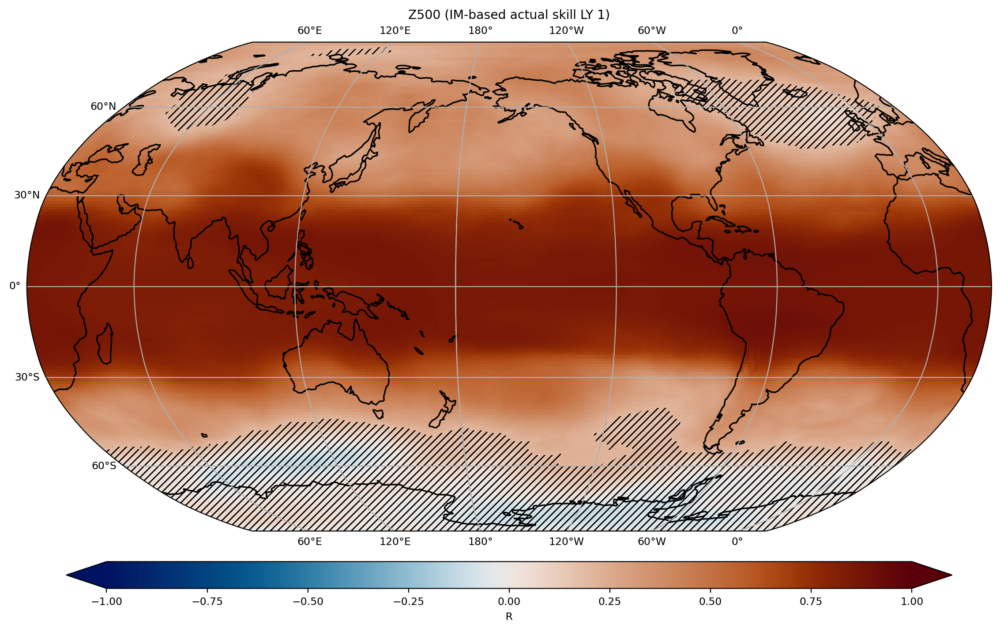

elasped time for calculating correlation: 8.9884033203125


In [115]:
# plot for HCST (LY1)

start_time = time.time()


varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=corr_HCST.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap=cm.vik, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well



ax2.coastlines(resolution='110m', color='black', linewidth=1.2)

ax2.set_title(f'{varn} (IM-based actual skill LY 1)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

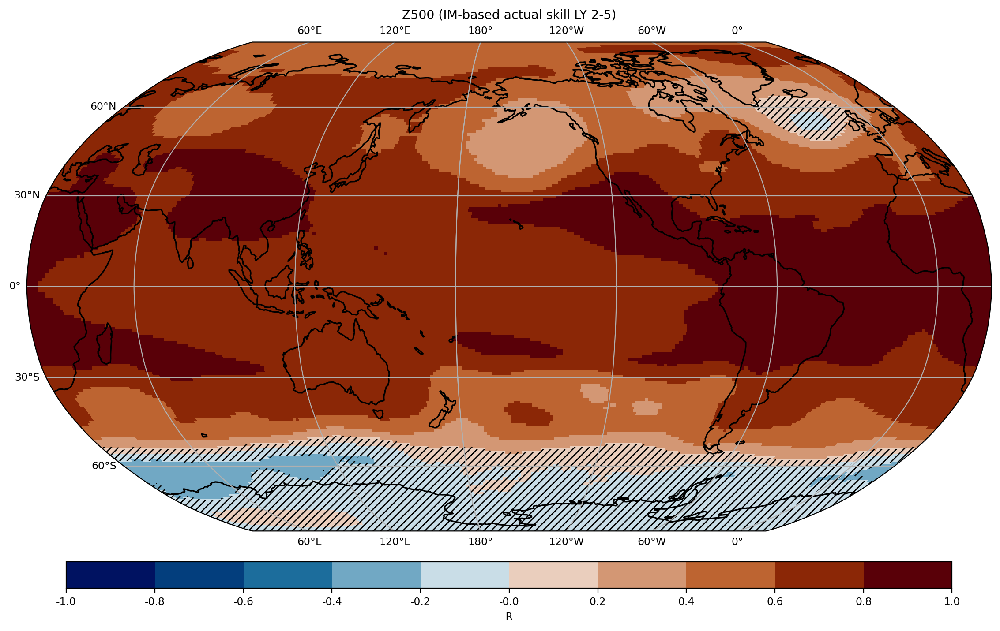

elasped time for figure: 5.276153087615967


In [157]:
# plot for HCST (LY2-5)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=corr_HCST_IM_ly2_5.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var.var

data_array = data_array.where(data_array != 0, np.nan)

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33}

plt1=data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1, cmap= cm_vik_10, cbar_kwargs=cbar_kwargs)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well


ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
ax2.set_title(f'{varn} (IM-based actual skill LY 2-5)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

cbar = plt1.colorbar
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

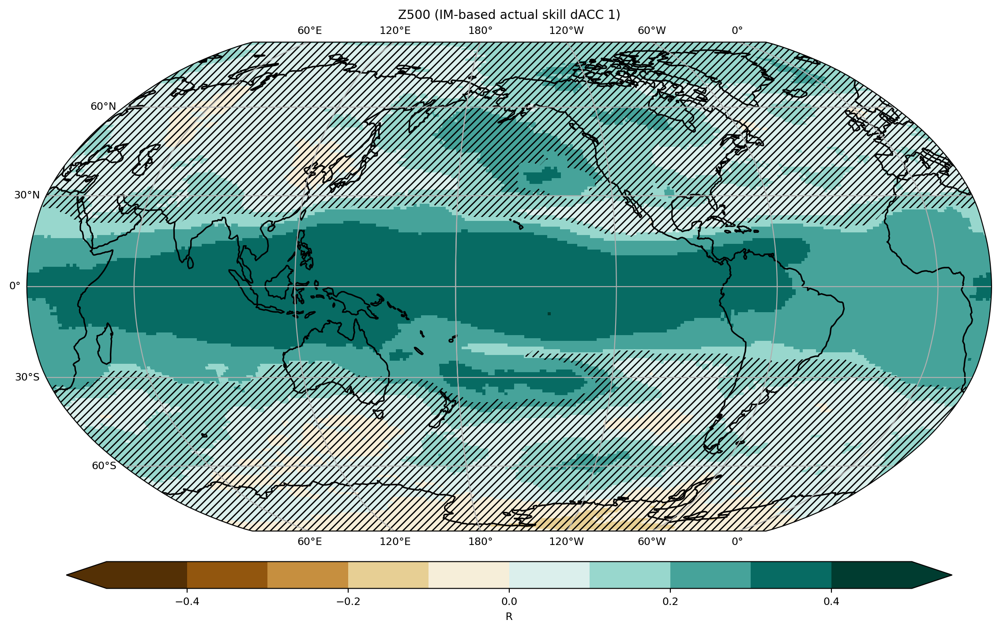

elasped time for figure: 5.573843955993652


In [142]:
# plot for HCST (LY2-5)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array1 =corr_LE_IM.median(dim='ens_LE')
data_array2 =corr_HCST_IM.median(dim='ens_HCST')
data_array=data_array2-data_array1

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

new_da=append_first_column_and_update_lon(data_array)
new_p_value=append_first_column_and_update_lon(p_value)

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=new_da.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), cbar_kwargs=cbar_kwargs)
contour1 = new_p_value.where(new_p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well

ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
ax2.set_title(f'{varn} (IM-based actual skill dACC 1)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

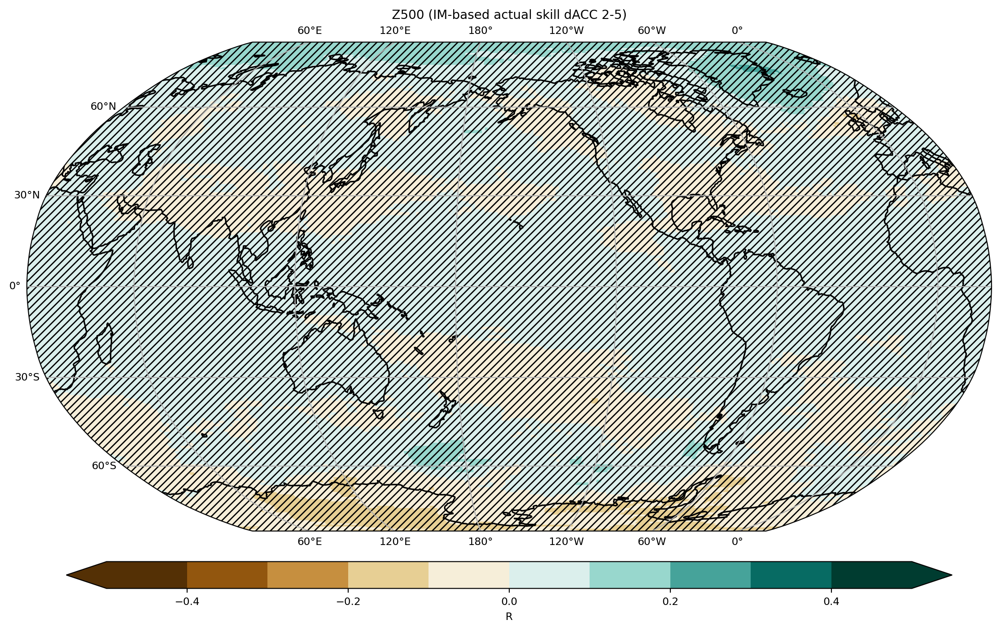

elasped time for figure: 5.466689825057983


In [143]:
# plot for HCST (LY2-5)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array1 =corr_LE_IM_ly2_5.median(dim='ens_LE')
data_array2 =corr_HCST_IM_ly2_5.median(dim='ens_HCST')
data_array=data_array2-data_array1

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)


data_array.attrs['name'] = cfg_var.var
data_array = data_array.where(data_array != 0, np.nan)

new_da=append_first_column_and_update_lon(data_array)
new_p_value=append_first_column_and_update_lon(p_value)

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=new_da.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), cbar_kwargs=cbar_kwargs)
contour1 = new_p_value.where(new_p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well

ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
ax2.set_title(f'{varn} (IM-based actual skill dACC 2-5)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for figure: ' + str(elapsed_time))

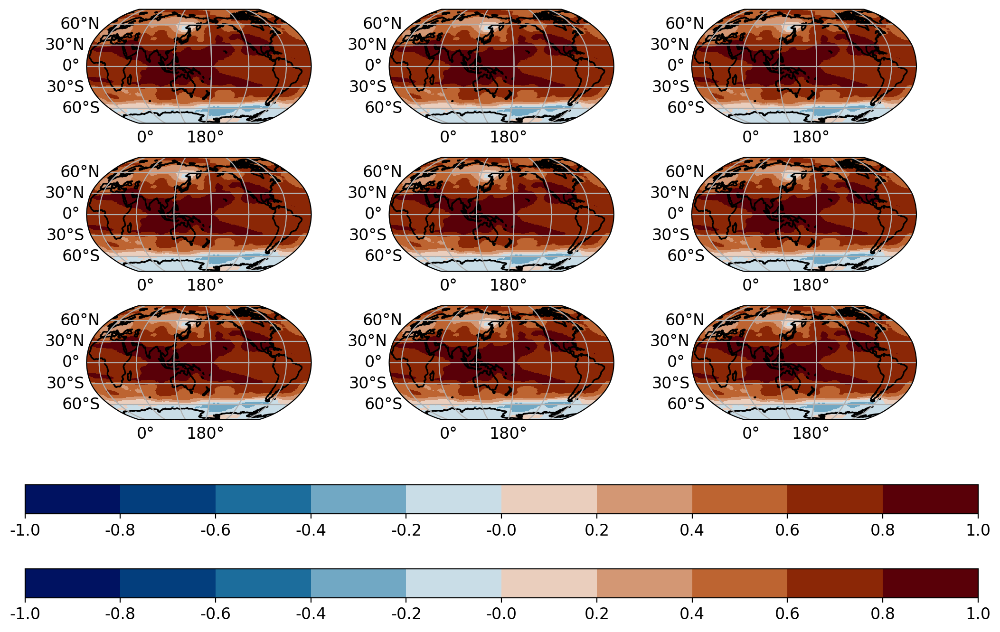

In [194]:
# example

# 3x3 플롯 설정
fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.Robinson(central_longitude=160)})
# fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.PlateCarree(central_longitude=160)})

# cbar_kwargs 설정
cbar_kwargs = {'orientation': 'horizontal', 'pad': 0.05, 'shrink': 0.7, 'label': ' R ', 'aspect': 33}

# 데이터를 반복하면서 각 서브플롯에 그리기
for i in range(3):
    for j in range(3):
        ax2 = axs[i, j]  # (i, j) 위치의 서브플롯 선택

        # 예시 데이터 로드 및 처리
        varn = cfg_var.var  # 예시

        # data_array = corr_HCST_IM_ly2_5.median(dim='ens_HCST')
        # p_value = p_value_from_r(data_array, n_LY1)
        # p_value = xr.DataArray(
        #     p_value,
        #     dims=data_array.dims,
        #     coords=data_array.coords,
        # )

        # data_array.attrs['name'] = cfg_var.var
        # data_array = data_array.where(data_array != 0, np.nan)

        # Plotting
        plt1 = data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
        # contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)

        # Coastlines, title, gridlines
        ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
        gl=ax2.gridlines(draw_labels=True)
        gl.xlabels_top = False  # 위쪽 레이블 제거

        # x, y 축 포맷 설정
        ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
        ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

# 색상바 추가 (전체 플롯에 하나만)
cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=0, shrink=0.7, aspect=33)
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar.ax.tick_params(labelsize=12)


cbar2 = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.6, shrink=0.7, aspect=33)
cbar2.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar2.ax.tick_params(labelsize=12)

# 서브플롯 간의 여백 줄이기
plt.subplots_adjust(hspace=0.3, wspace=-0.6, bottom=0.4)  # 아래쪽 여백을 추가해서 색상바가 겹치지 않도록 조정
plt.rcParams.update({'font.size': 12})  # 원하는 폰트 크기로 변경

# 최종 플롯 보여주기
plt.show()

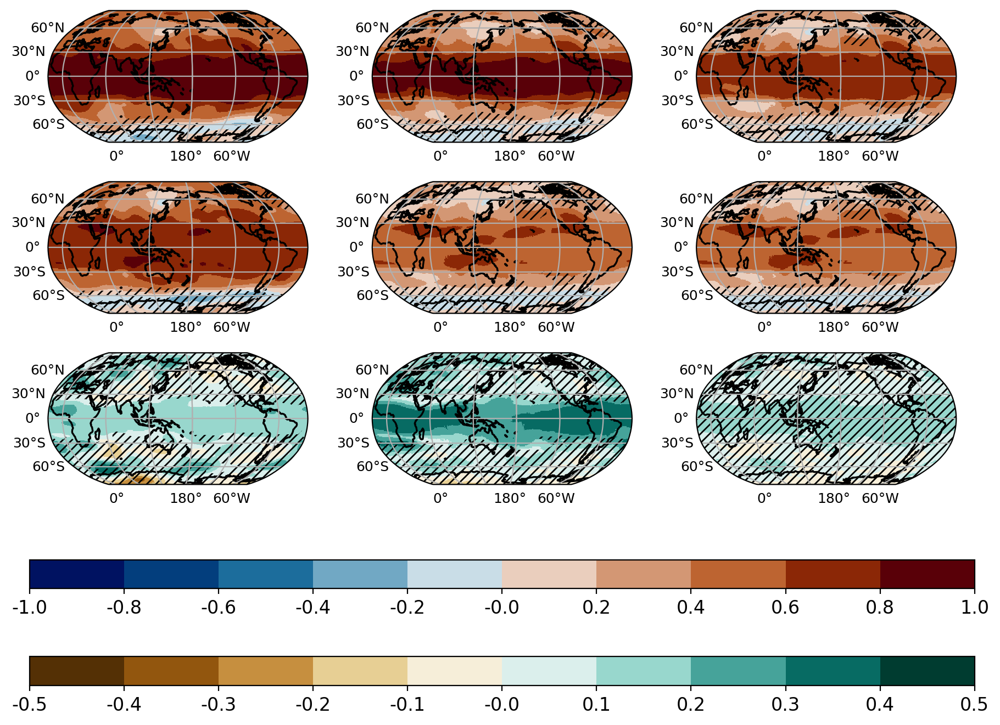

In [259]:
# example ly2

# 3x3 플롯 설정
fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.Robinson(central_longitude=160)})
# fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.PlateCarree(central_longitude=160)})

varn = cfg_var.var

# cbar_kwargs 설정
cbar_kwargs = {'orientation': 'horizontal', 'pad': 0.05, 'shrink': 0.7, 'label': ' R ', 'aspect': 33}


###----------------------------------------------------------------------- plot [0,0]

ax1= axs[0, 0]

data_array = corr_HCST_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

# data_array.attrs['name'] = cfg_var.var
# data_array = data_array.where(data_array != 0, np.nan)
plt1 = data_array.plot.pcolormesh(ax=ax1, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax1.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax1.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax1.set_title("")

###----------------------------------------------------------------------- plot [0,1]

ax2= axs[0, 1]

data_array = corr_HCST_IM.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt2 = data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour2 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax2.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax2.set_title("")

###----------------------------------------------------------------------- plot [0,2]

ax3= axs[0, 2]

data_array = corr_HCST_IM_ly2.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1-1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt3 = data_array.plot.pcolormesh(ax=ax3, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour3 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax3.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax3.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax3.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax3.set_title("")



###----------------------------------------------------------------------- plot [1,0]

ax4= axs[1, 0]

data_array = corr_LE_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt4 = data_array.plot.pcolormesh(ax=ax4, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour4 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax4.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax4.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax4.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax4.set_title("")




###----------------------------------------------------------------------- plot [1,1]

ax5= axs[1, 1]

data_array = corr_LE_IM.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt5 = data_array.plot.pcolormesh(ax=ax5, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour5 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax5.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax5.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax5.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax5.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax5.set_title("")


###----------------------------------------------------------------------- plot [1,2]

ax6= axs[1, 2]

data_array = corr_LE_IM.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt6 = data_array.plot.pcolormesh(ax=ax6, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour6 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax6.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax6.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax6.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax6.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax6.set_title("")



###----------------------------------------------------------------------- plot [2,0]

ax7= axs[2, 0]

data_array1 = corr_HCST_EM
data_array2 = corr_LE_EM

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt7 = data_array.plot.pcolormesh(ax=ax7, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour7 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax7.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax7.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax7.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax7.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax7.set_title("")



###----------------------------------------------------------------------- plot [2,1]

ax8= axs[2, 1]

data_array1 = corr_HCST_IM.median(dim='ens_HCST')
data_array2 = corr_LE_IM.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt8 = data_array.plot.pcolormesh(ax=ax8, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour8 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax8.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax8.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax8.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax8.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax8.set_title("")


###----------------------------------------------------------------------- plot [2,2]

ax9= axs[2, 2]

data_array1 = corr_HCST_IM_ly2.median(dim='ens_HCST')
data_array2 = corr_LE_IM.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1-1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt9 = data_array.plot.pcolormesh(ax=ax9, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour9 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax9, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax9.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax9.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax9.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax9.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax9.set_title("")

# # 색상바 추가 (전체 플롯에 하나만)
cbar2 = fig.colorbar(plt7, ax=axs, orientation='horizontal', pad=0, shrink=0.6, aspect=33)
cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
cbar2.ax.tick_params(labelsize=12)


cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.6, shrink=0.6, aspect=33)
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar.ax.tick_params(labelsize=12)


# # 색상바 추가 (전체 플롯에 하나만)
# cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.2, shrink=0.7, aspect=33)
# cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
# cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
# cbar.ax.tick_params(labelsize=12)


# cbar2 = fig.colorbar(plt7, ax=axs, orientation='horizontal', pad=0, shrink=0.7, aspect=33)
# cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
# cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
# cbar2.ax.tick_params(labelsize=12)


# 서브플롯 간의 여백 줄이기
plt.subplots_adjust(hspace=0.3, wspace=-0.65, bottom=0.4)  # 아래쪽 여백을 추가해서 색상바가 겹치지 않도록 조정
plt.rcParams.update({'font.size': 9})  # 원하는 폰트 크기로 변경

# 최종 플롯 보여주기
plt.show()

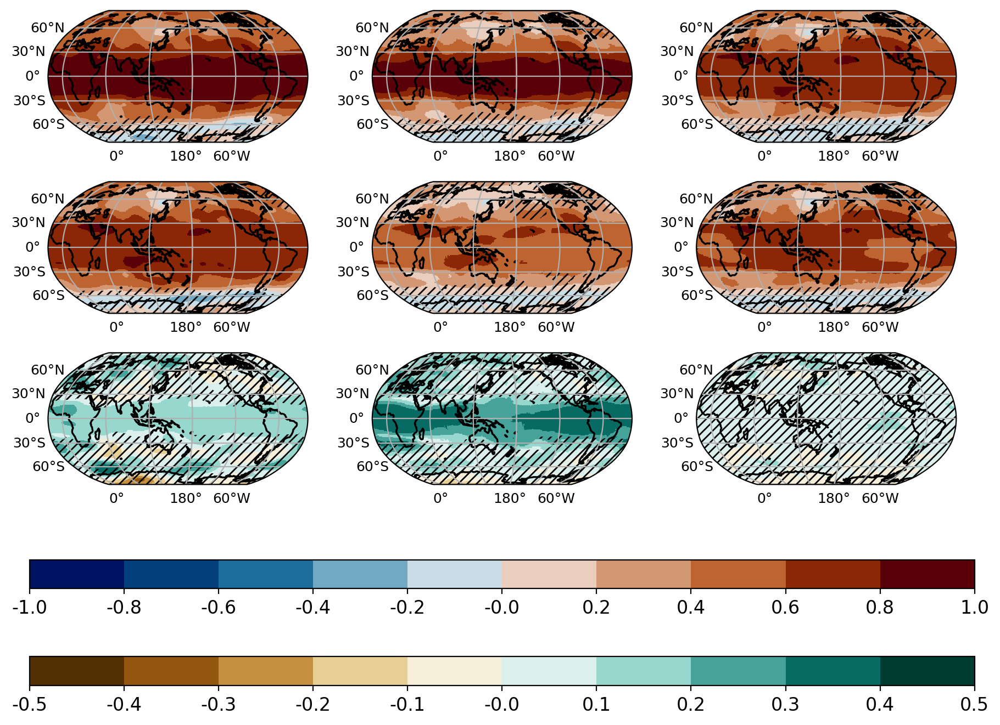

In [253]:
# example ly23

# 3x3 플롯 설정
fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.Robinson(central_longitude=160)})
# fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.PlateCarree(central_longitude=160)})

varn = cfg_var.var

# cbar_kwargs 설정
cbar_kwargs = {'orientation': 'horizontal', 'pad': 0.05, 'shrink': 0.7, 'label': ' R ', 'aspect': 33}


###----------------------------------------------------------------------- plot [0,0]

ax1= axs[0, 0]

data_array = corr_HCST_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

# data_array.attrs['name'] = cfg_var.var
# data_array = data_array.where(data_array != 0, np.nan)
plt1 = data_array.plot.pcolormesh(ax=ax1, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax1.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax1.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax1.set_title("")

###----------------------------------------------------------------------- plot [0,1]

ax2= axs[0, 1]

data_array = corr_HCST_IM.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt2 = data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour2 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax2.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax2.set_title("")

###----------------------------------------------------------------------- plot [0,2]

ax3= axs[0, 2]

data_array = corr_HCST_IM_ly2_3.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY2_3)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt3 = data_array.plot.pcolormesh(ax=ax3, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour3 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax3.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax3.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax3.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax3.set_title("")



###----------------------------------------------------------------------- plot [1,0]

ax4= axs[1, 0]

data_array = corr_LE_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt4 = data_array.plot.pcolormesh(ax=ax4, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour4 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax4.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax4.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax4.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax4.set_title("")




###----------------------------------------------------------------------- plot [1,1]

ax5= axs[1, 1]

data_array = corr_LE_IM.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt5 = data_array.plot.pcolormesh(ax=ax5, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour5 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax5.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax5.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax5.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax5.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax5.set_title("")


###----------------------------------------------------------------------- plot [1,2]

ax6= axs[1, 2]

data_array = corr_LE_IM_ly2_3.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY2_3)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt6 = data_array.plot.pcolormesh(ax=ax6, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour6 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax6.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax6.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax6.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax6.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax6.set_title("")



###----------------------------------------------------------------------- plot [2,0]

ax7= axs[2, 0]

data_array1 = corr_HCST_EM
data_array2 = corr_LE_EM

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt7 = data_array.plot.pcolormesh(ax=ax7, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour7 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax7.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax7.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax7.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax7.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax7.set_title("")



###----------------------------------------------------------------------- plot [2,1]

ax8= axs[2, 1]

data_array1 = corr_HCST_IM.median(dim='ens_HCST')
data_array2 = corr_LE_IM.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt8 = data_array.plot.pcolormesh(ax=ax8, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour8 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax8.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax8.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax8.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax8.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax8.set_title("")


###----------------------------------------------------------------------- plot [2,2]

ax9= axs[2, 2]

data_array1 = corr_HCST_IM_ly2_3.median(dim='ens_HCST')
data_array2 = corr_LE_IM_ly2_3.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY2_3, n_LY2_3)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt9 = data_array.plot.pcolormesh(ax=ax9, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour9 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax9, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax9.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax9.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax9.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax9.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax9.set_title("")

# # 색상바 추가 (전체 플롯에 하나만)
cbar2 = fig.colorbar(plt7, ax=axs, orientation='horizontal', pad=0, shrink=0.6, aspect=33)
cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
cbar2.ax.tick_params(labelsize=12)


cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.6, shrink=0.6, aspect=33)
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar.ax.tick_params(labelsize=12)


# # 색상바 추가 (전체 플롯에 하나만)
# cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.2, shrink=0.7, aspect=33)
# cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
# cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
# cbar.ax.tick_params(labelsize=12)


# cbar2 = fig.colorbar(plt7, ax=axs, orientation='horizontal', pad=0, shrink=0.7, aspect=33)
# cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
# cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
# cbar2.ax.tick_params(labelsize=12)


# 서브플롯 간의 여백 줄이기
plt.subplots_adjust(hspace=0.3, wspace=-0.65, bottom=0.4)  # 아래쪽 여백을 추가해서 색상바가 겹치지 않도록 조정
plt.rcParams.update({'font.size': 9})  # 원하는 폰트 크기로 변경

# 최종 플롯 보여주기
plt.show()

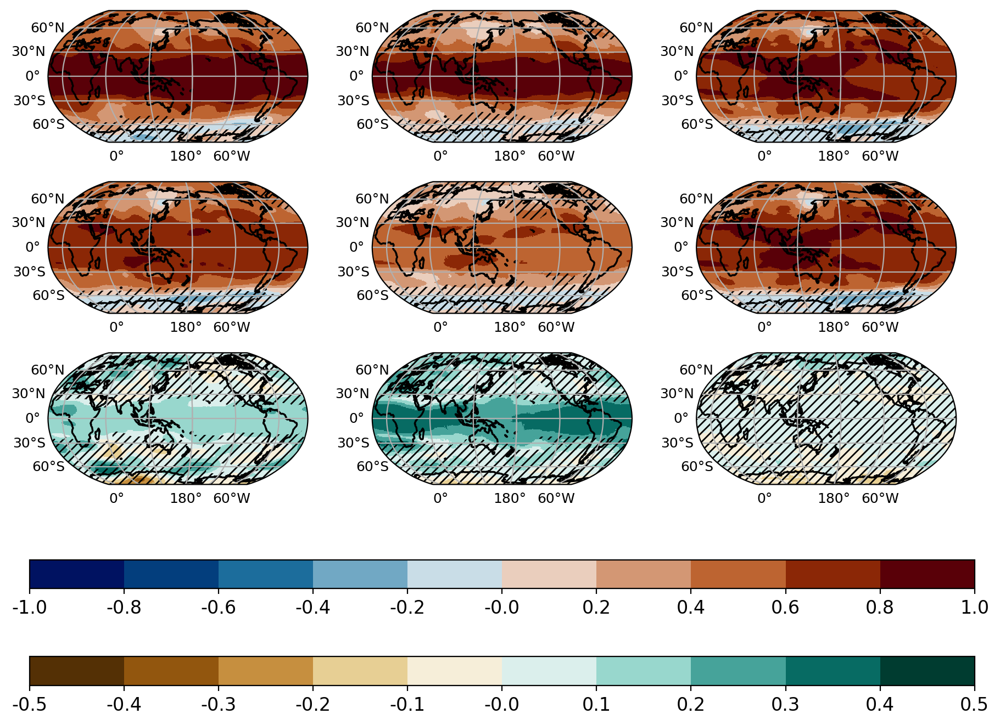

In [233]:
# example ly25

# 3x3 플롯 설정
fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.Robinson(central_longitude=160)})
# fig, axs = plt.subplots(3, 3, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.PlateCarree(central_longitude=160)})

varn = cfg_var.var

# cbar_kwargs 설정
cbar_kwargs = {'orientation': 'horizontal', 'pad': 0.05, 'shrink': 0.7, 'label': ' R ', 'aspect': 33}


###----------------------------------------------------------------------- plot [0,0]

ax1= axs[0, 0]

data_array = corr_HCST_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

# data_array.attrs['name'] = cfg_var.var
# data_array = data_array.where(data_array != 0, np.nan)
plt1 = data_array.plot.pcolormesh(ax=ax1, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax1.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax1.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax1.set_title("")

###----------------------------------------------------------------------- plot [0,1]

ax2= axs[0, 1]

data_array = corr_HCST_IM.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt2 = data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour2 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax2.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax2.set_title("")

###----------------------------------------------------------------------- plot [0,2]

ax3= axs[0, 2]

data_array = corr_HCST_IM_ly2_5.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY2_5)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt3 = data_array.plot.pcolormesh(ax=ax3, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour3 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax3.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax3.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax3.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax3.set_title("")



###----------------------------------------------------------------------- plot [1,0]

ax4= axs[1, 0]

data_array = corr_LE_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt4 = data_array.plot.pcolormesh(ax=ax4, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour4 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax4.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax4.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax4.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax4.set_title("")




###----------------------------------------------------------------------- plot [1,1]

ax5= axs[1, 1]

data_array = corr_LE_IM.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt5 = data_array.plot.pcolormesh(ax=ax5, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour5 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax5.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax5.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax5.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax5.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax5.set_title("")


###----------------------------------------------------------------------- plot [1,2]

ax6= axs[1, 2]

data_array = corr_LE_IM_ly2_5.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY2_5)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt6 = data_array.plot.pcolormesh(ax=ax6, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour6 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax6.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax6.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax6.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax6.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax6.set_title("")



###----------------------------------------------------------------------- plot [2,0]

ax7= axs[2, 0]

data_array1 = corr_HCST_EM
data_array2 = corr_LE_EM

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt7 = data_array.plot.pcolormesh(ax=ax7, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour7 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax7.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax7.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax7.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax7.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax7.set_title("")



###----------------------------------------------------------------------- plot [2,1]

ax8= axs[2, 1]

data_array1 = corr_HCST_IM.median(dim='ens_HCST')
data_array2 = corr_LE_IM.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt8 = data_array.plot.pcolormesh(ax=ax8, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour8 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax8.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax8.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax8.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax8.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax8.set_title("")


###----------------------------------------------------------------------- plot [2,1]

ax9= axs[2, 2]

data_array1 = corr_HCST_IM_ly2_5.median(dim='ens_HCST')
data_array2 = corr_LE_IM_ly2_5.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY2_5, n_LY2_5)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt9 = data_array.plot.pcolormesh(ax=ax9, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour9 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax9, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax9.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax9.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax9.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax9.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax9.set_title("")

# # 색상바 추가 (전체 플롯에 하나만)
cbar2 = fig.colorbar(plt7, ax=axs, orientation='horizontal', pad=0, shrink=0.6, aspect=33)
cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
cbar2.ax.tick_params(labelsize=12)


cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.6, shrink=0.6, aspect=33)
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar.ax.tick_params(labelsize=12)


# # 색상바 추가 (전체 플롯에 하나만)
# cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.2, shrink=0.7, aspect=33)
# cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
# cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
# cbar.ax.tick_params(labelsize=12)


# cbar2 = fig.colorbar(plt7, ax=axs, orientation='horizontal', pad=0, shrink=0.7, aspect=33)
# cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
# cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
# cbar2.ax.tick_params(labelsize=12)


# 서브플롯 간의 여백 줄이기
plt.subplots_adjust(hspace=0.3, wspace=-0.65, bottom=0.4)  # 아래쪽 여백을 추가해서 색상바가 겹치지 않도록 조정
plt.rcParams.update({'font.size': 9})  # 원하는 폰트 크기로 변경

# 최종 플롯 보여주기
plt.show()

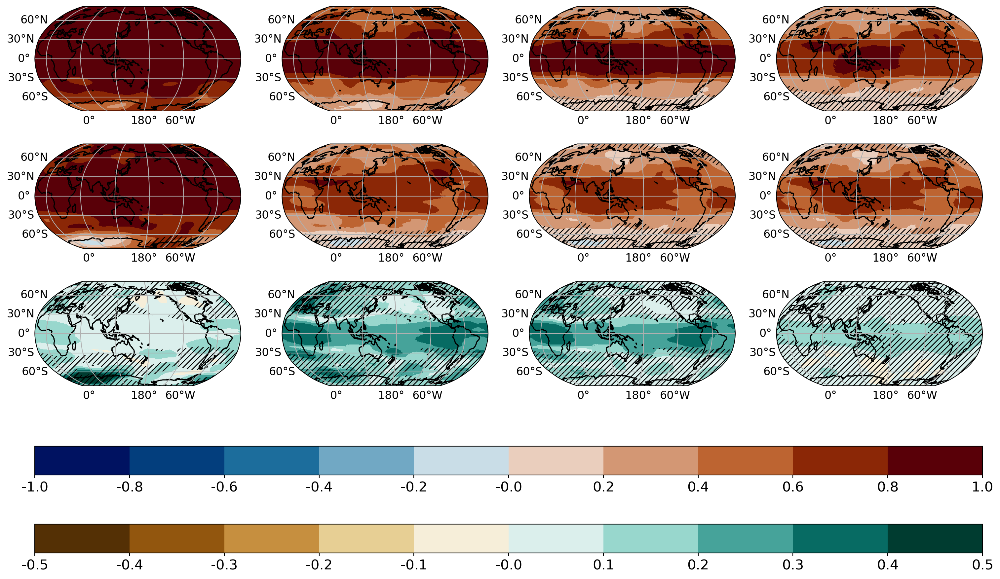

In [260]:
# example ly2

# 3x4 플롯 설정
fig, axs = plt.subplots(3, 4, figsize=(18.5, 12), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.Robinson(central_longitude=160)})
# fig, axs = plt.subplots(3, 4, figsize=(18.5, 12), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.PlateCarree(central_longitude=160)})

varn = cfg_var.var

# cbar_kwargs 설정
cbar_kwargs = {'orientation': 'horizontal', 'pad': 0.05, 'shrink': 0.7, 'label': ' R ', 'aspect': 33}


###----------------------------------------------------------------------- plot [0,0]

ax1= axs[0, 0]

data_array = pp_HCST_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

# data_array.attrs['name'] = cfg_var.var
# data_array = data_array.where(data_array != 0, np.nan)
plt1 = data_array.plot.pcolormesh(ax=ax1, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax1.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax1.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax1.set_title("")

###----------------------------------------------------------------------- plot [0,1]

ax2= axs[0, 1]

data_array = pp_HCST_EM_IM.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt2 = data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour2 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax2.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax2.set_title("")

###----------------------------------------------------------------------- plot [0,2]

ax3= axs[0, 2]

data_stacked = pp_HCST_IM.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt3 = data_array.plot.pcolormesh(ax=ax3, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour3 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax3.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax3.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax3.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax3.set_title("")


###----------------------------------------------------------------------- plot [0,3]

ax4= axs[0, 3]

data_stacked = pp_HCST_IM_ly2.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY1-1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt4 = data_array.plot.pcolormesh(ax=ax4, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour4 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax4.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax4.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax4.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax4.set_title("")



###----------------------------------------------------------------------- plot [1,0]

ax5= axs[1, 0]

data_array = pp_LE_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt5 = data_array.plot.pcolormesh(ax=ax5, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour5 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax5.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax5.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax5.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax5.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax5.set_title("")




###----------------------------------------------------------------------- plot [1,1]

ax6= axs[1, 1]

data_array = pp_LE_EM_IM.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt6 = data_array.plot.pcolormesh(ax=ax6, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour6 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax6.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax6.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax6.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax6.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax6.set_title("")


###----------------------------------------------------------------------- plot [1,2]

ax7= axs[1, 2]

data_stacked = pp_LE_IM.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt7 = data_array.plot.pcolormesh(ax=ax7, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour7 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax7.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax7.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax7.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax7.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax7.set_title("")



###----------------------------------------------------------------------- plot [1,3]

ax8= axs[1, 3]

data_stacked = pp_LE_IM.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt8 = data_array.plot.pcolormesh(ax=ax8, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour8 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax8.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax8.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax8.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax8.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax8.set_title("")




###----------------------------------------------------------------------- plot [2,0]

ax9= axs[2, 0]

data_array1 = pp_HCST_EM
data_array2 = pp_LE_EM

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt9 = data_array.plot.pcolormesh(ax=ax9, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour9 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax9, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax9.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax9.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax9.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax9.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax9.set_title("")



###----------------------------------------------------------------------- plot [2,1]

ax10= axs[2, 1]

data_array1 = pp_HCST_EM_IM.median(dim='ens_HCST')
data_array2 = pp_LE_EM_IM.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt10 = data_array.plot.pcolormesh(ax=ax10, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour10 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax10, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax10.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax10.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax10.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax10.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax10.set_title("")


###----------------------------------------------------------------------- plot [2,2]

ax11= axs[2, 2]

data_stacked = pp_HCST_IM.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array1 = data_stacked.median(dim='ens_combined')
data_stacked = pp_LE_IM.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array2 = data_stacked.median(dim='ens_combined')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt11 = data_array.plot.pcolormesh(ax=ax11, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour11 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax11.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax11.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax11.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax11.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax11.set_title("")


###----------------------------------------------------------------------- plot [2,3]

ax12= axs[2, 3]

data_stacked = pp_HCST_IM_ly2.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array1 = data_stacked.median(dim='ens_combined')
data_stacked = pp_LE_IM.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array2 = data_stacked.median(dim='ens_combined')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1-1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt12 = data_array.plot.pcolormesh(ax=ax12, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour12 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax12, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax12.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax12.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax12.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax12.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax12.set_title("")




# # 색상바 추가 (전체 플롯에 하나만)
cbar2 = fig.colorbar(plt9, ax=axs, orientation='horizontal', pad=0, shrink=1, aspect=33)
cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
cbar2.ax.tick_params(labelsize=15)

cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.4, shrink=1, aspect=33)
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar.ax.tick_params(labelsize=15)

# 서브플롯 간의 여백 줄이기
plt.subplots_adjust(hspace=0.3, wspace=0.2, bottom=0.4)  # 아래쪽 여백을 추가해서 색상바가 겹치지 않도록 조정
plt.rcParams.update({'font.size': 12})  # 원하는 폰트 크기로 변경

# 최종 플롯 보여주기
plt.show()

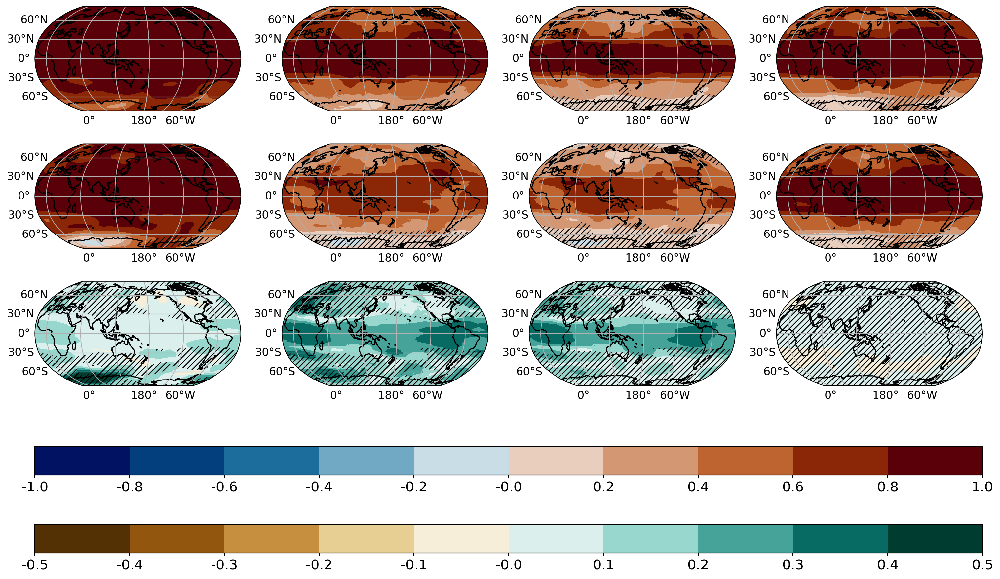

In [242]:
# example ly2_5

# 3x4 플롯 설정
fig, axs = plt.subplots(3, 4, figsize=(18.5, 12), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.Robinson(central_longitude=160)})
# fig, axs = plt.subplots(3, 4, figsize=(18.5, 12), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': ccrs.PlateCarree(central_longitude=160)})

varn = cfg_var.var

# cbar_kwargs 설정
cbar_kwargs = {'orientation': 'horizontal', 'pad': 0.05, 'shrink': 0.7, 'label': ' R ', 'aspect': 33}


###----------------------------------------------------------------------- plot [0,0]

ax1= axs[0, 0]

data_array = pp_HCST_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

# data_array.attrs['name'] = cfg_var.var
# data_array = data_array.where(data_array != 0, np.nan)
plt1 = data_array.plot.pcolormesh(ax=ax1, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour1 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax1.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax1.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax1.set_title("")

###----------------------------------------------------------------------- plot [0,1]

ax2= axs[0, 1]

data_array = pp_HCST_EM_IM.median(dim='ens_HCST')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt2 = data_array.plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour2 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax2.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax2.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax2.set_title("")

###----------------------------------------------------------------------- plot [0,2]

ax3= axs[0, 2]

data_stacked = pp_HCST_IM.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt3 = data_array.plot.pcolormesh(ax=ax3, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour3 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax3.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax3.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax3.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax3.set_title("")


###----------------------------------------------------------------------- plot [0,3]

ax4= axs[0, 3]

data_stacked = pp_HCST_IM_ly2_5.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY2_5)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt4 = data_array.plot.pcolormesh(ax=ax4, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour4 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax4.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax4.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax4.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax4.set_title("")



###----------------------------------------------------------------------- plot [1,0]

ax5= axs[1, 0]

data_array = pp_LE_EM
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)

plt5 = data_array.plot.pcolormesh(ax=ax5, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour5 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax5.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax5.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax5.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax5.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax5.set_title("")




###----------------------------------------------------------------------- plot [1,1]

ax6= axs[1, 1]

data_array = pp_LE_EM_IM.median(dim='ens_LE')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt6 = data_array.plot.pcolormesh(ax=ax6, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour6 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax6.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax6.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax6.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax6.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax6.set_title("")


###----------------------------------------------------------------------- plot [1,2]

ax7= axs[1, 2]

data_stacked = pp_LE_IM.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt7 = data_array.plot.pcolormesh(ax=ax7, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour7 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax7.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax7.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax7.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax7.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax7.set_title("")



###----------------------------------------------------------------------- plot [1,3]

ax8= axs[1, 3]

data_stacked = pp_LE_IM_ly2_5.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array = data_stacked.median(dim='ens_combined')
p_value = p_value_from_r(data_array, n_LY2_5)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,
    coords=data_array.coords,
)


plt8 = data_array.plot.pcolormesh(ax=ax8, transform=ccrs.PlateCarree(central_longitude=160), vmax=1, vmin=-1, cmap=cm_vik_10, add_colorbar=False)
contour8 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax8.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax8.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax8.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax8.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax8.set_title("")




###----------------------------------------------------------------------- plot [2,0]

ax9= axs[2, 0]

data_array1 = pp_HCST_EM
data_array2 = pp_LE_EM

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt9 = data_array.plot.pcolormesh(ax=ax9, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour9 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax9, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax9.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax9.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax9.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax9.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax9.set_title("")



###----------------------------------------------------------------------- plot [2,1]

ax10= axs[2, 1]

data_array1 = pp_HCST_EM_IM.median(dim='ens_HCST')
data_array2 = pp_LE_EM_IM.median(dim='ens_LE')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt10 = data_array.plot.pcolormesh(ax=ax10, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour10 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax10, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax10.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax10.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax10.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax10.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax10.set_title("")


###----------------------------------------------------------------------- plot [2,2]

ax11= axs[2, 2]

data_stacked = pp_HCST_IM.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array1 = data_stacked.median(dim='ens_combined')
data_stacked = pp_LE_IM.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array2 = data_stacked.median(dim='ens_combined')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY1, n_LY1)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt11 = data_array.plot.pcolormesh(ax=ax11, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour11 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax11.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax11.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax11.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax11.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax11.set_title("")


###----------------------------------------------------------------------- plot [2,3]

ax12= axs[2, 3]

data_stacked = pp_HCST_IM_ly2_5.stack(ens_combined=("ens_HCST", "ens_ODA"))
data_array1 = data_stacked.median(dim='ens_combined')
data_stacked = pp_LE_IM_ly2_5.stack(ens_combined=("ens_LE", "ens_ODA"))
data_array2 = data_stacked.median(dim='ens_combined')

data_array = data_array1-data_array2

z_val, p_value=correlation_difference_significance(data_array1, data_array2, n_LY2_5, n_LY2_5)
p_value = xr.DataArray(
    p_value,
    dims=data_array.dims,  # 원래 데이터의 차원
    coords=data_array.coords,  # 원래 데이터의 좌표
)

plt12 = data_array.plot.pcolormesh(ax=ax12, transform=ccrs.PlateCarree(central_longitude=160), vmax=0.5, vmin=-0.5, cmap=cm2.get_cmap('BrBG', 10), add_colorbar=False)
contour12 = p_value.where(p_value >= 0.1, np.nan).plot.contourf(ax=ax12, transform=ccrs.PlateCarree(), levels=[0, 1], alpha=0, colors='none', hatches=['////'], add_colorbar=False)
ax12.coastlines(resolution='110m', color='black', linewidth=1.2)
gl=ax12.gridlines(draw_labels=True)
gl.xlabels_top = False  # 위쪽 레이블 제거

# x, y 축 포맷 설정
ax12.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax12.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))
ax12.set_title("")




# # 색상바 추가 (전체 플롯에 하나만)
cbar2 = fig.colorbar(plt9, ax=axs, orientation='horizontal', pad=0, shrink=1, aspect=33)
cbar2.set_ticks(np.arange(-0.5, 0.6, 0.1))  # 0.2 간격으로 눈금 설정
cbar2.set_ticklabels([f'{i:.1f}' for i in np.arange(-0.5, 0.6, 0.1)])  # 눈금 라벨 형식 변경
cbar2.ax.tick_params(labelsize=15)

cbar = fig.colorbar(plt1, ax=axs, orientation='horizontal', pad=-0.4, shrink=1, aspect=33)
cbar.set_ticks(np.arange(-1, 1.1, 0.2))  # 0.2 간격으로 눈금 설정
cbar.set_ticklabels([f'{i:.1f}' for i in np.arange(-1, 1.1, 0.2)])  # 눈금 라벨 형식 변경
cbar.ax.tick_params(labelsize=15)

# 서브플롯 간의 여백 줄이기
plt.subplots_adjust(hspace=0.3, wspace=0.2, bottom=0.4)  # 아래쪽 여백을 추가해서 색상바가 겹치지 않도록 조정
plt.rcParams.update({'font.size': 12})  # 원하는 폰트 크기로 변경

# 최종 플롯 보여주기
plt.show()